In [32]:
import matplotlib.pyplot as plt
import numpy as np

from csbdeep.utils import normalize
from glob import glob
from skimage import io
from stardist import random_label_cmap
from stardist.matching import matching_dataset
from stardist.models import StarDist2D
from tqdm import tqdm

In [3]:
taus = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Load Images and Masks

In [100]:
image_dir = f'images'
hela_dir = f'{image_dir}/fluo-ND2L-HeLa'
merfish_dir = f'{image_dir}/merfish'

model_dir = 'models'

In [24]:
lbl_cmap = random_label_cmap()

In [46]:
# Read test images and masks, normalize test images
hela_X_test_names = sorted(glob(f'{hela_dir}/test/images/*.tif'))
hela_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, hela_X_test_names))]
hela_Y_test_names = sorted(glob(f'{hela_dir}/test/masks/*.tif'))
hela_Y_test = list(map(io.imread, hela_Y_test_names))

# 8 images (20%) chosen for test
merfish_X_test_names = sorted(glob(f'{merfish_dir}/test/images/*.tif'))
merfish_X_test = [normalize(img, 1, 99.8, axis=(0, 1)) for img in list(map(io.imread, merfish_X_test_names))]

# Pretrained StarDist Model on HeLa Cells

In [28]:
# Load pretrained model for 2d fluorescent images
pretrained_stardist_model = StarDist2D.from_pretrained('2D_versatile_fluo')

Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


In [33]:
pretrained_stardist_hela_Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(hela_X_test)]

100%|██████████| 92/92 [03:22<00:00,  2.20s/it]


In [35]:
pretrained_stardist_hela_Y_pred_labels = [pred[0] for pred in pretrained_stardist_hela_Y_pred]
pretrained_stardist_hela_stats = [matching_dataset(hela_Y_test, pretrained_stardist_hela_Y_pred_labels, thresh=t, show_progress=False) for t in tqdm(taus)]

100%|██████████| 9/9 [00:29<00:00,  3.29s/it]


In [36]:
pretrained_stardist_hela_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=3027, tp=24156, fn=665, precision=0.8886436375675973, recall=0.9732081705007857, accuracy=0.8674231542660155, f1=0.9290054611183756, n_true=24821, n_pred=27183, mean_true_score=0.8899826710520118, mean_matched_score=0.9144833531289114, panoptic_quality=0.8495600291586025, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=3030, tp=24153, fn=668, precision=0.8885332744730162, recall=0.9730873051045486, accuracy=0.8672220028006176, f1=0.9288900853780478, n_true=24821, n_pred=27183, mean_true_score=0.8899665271240133, mean_matched_score=0.9145803490144137, panoptic_quality=0.8495446184810835, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=3061, tp=24122, fn=699, precision=0.8873928558290107, recall=0.9718383626767656, accuracy=0.8651459723118858, f1=0.9276978693946619, n_true=24821, n_pred=27183, mean_true_score=0.88965038213949, mean_matched_score=0.9154304010896395, panoptic_quality=0.8492428326699593, by

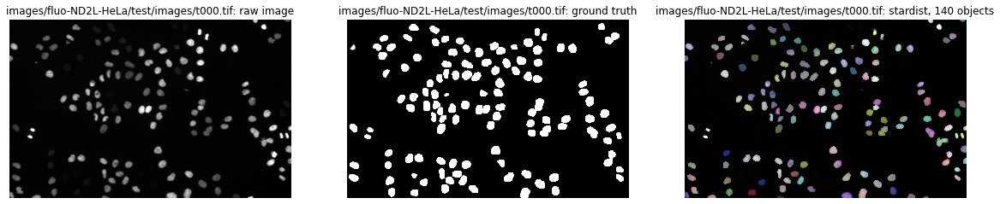

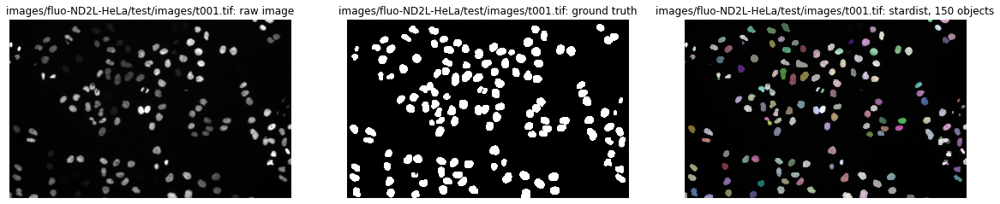

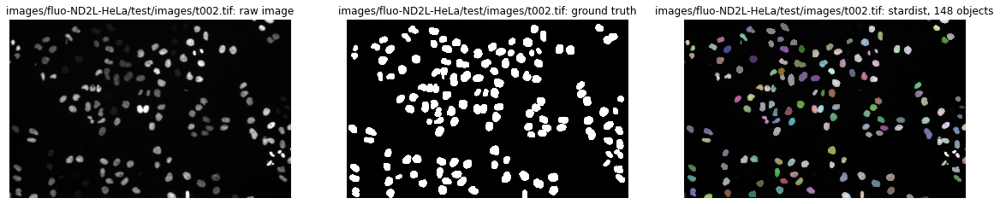

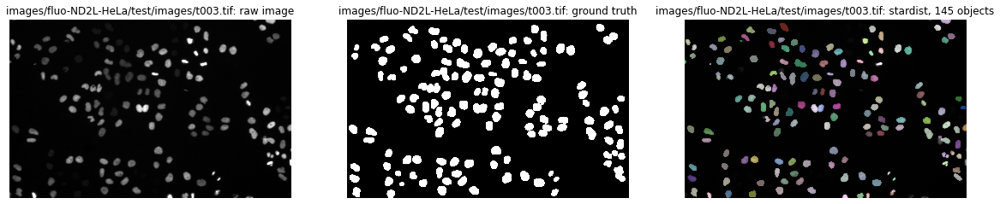

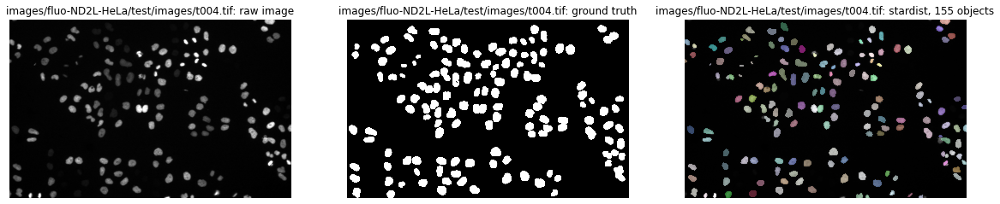

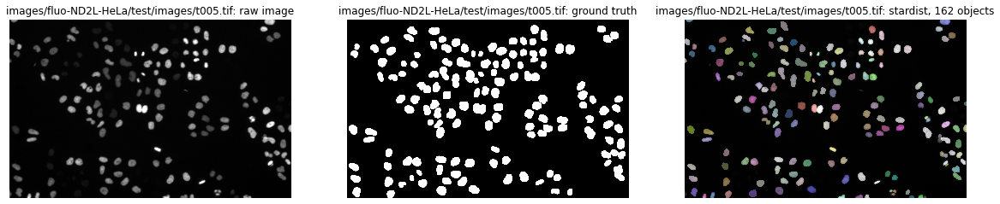

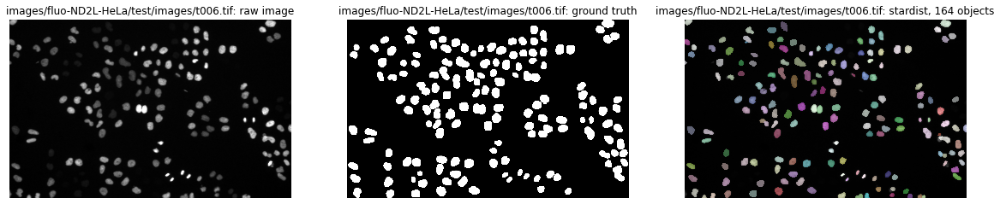

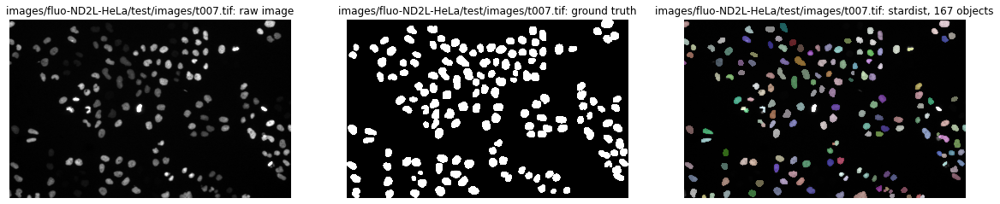

In [78]:
# Some sample labelled images
for i in range(8):
  fig, axes = plt.subplots(1, 3, figsize=(20, 10))
  axes[0].imshow(hela_X_test[i], clim=(0,1), cmap='gray')
  axes[0].set_title(f'{hela_X_test_names[i]}: raw image')
  axes[0].axis('off')
  axes[1].imshow(hela_Y_test[i], clim=(0,1), cmap='gray')
  axes[1].set_title(f'{hela_X_test_names[i]}: ground truth')
  axes[1].axis('off')
  axes[2].imshow(hela_X_test[i], clim=(0,1), cmap='gray')
  axes[2].imshow(pretrained_stardist_hela_Y_pred[i][0], cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
  num_objects = len(pretrained_stardist_hela_Y_pred[i][1]['coord'])
  axes[2].set_title(f'{hela_X_test_names[i]}: stardist, {num_objects} objects')
  axes[2].axis('off')

# 2. Pretrained StarDist Model on MERFISH data

In [49]:
pretrained_stardist_merfish_Y_pred = [pretrained_stardist_model.predict_instances(x, n_tiles=pretrained_stardist_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

100%|██████████| 8/8 [01:38<00:00, 12.28s/it]


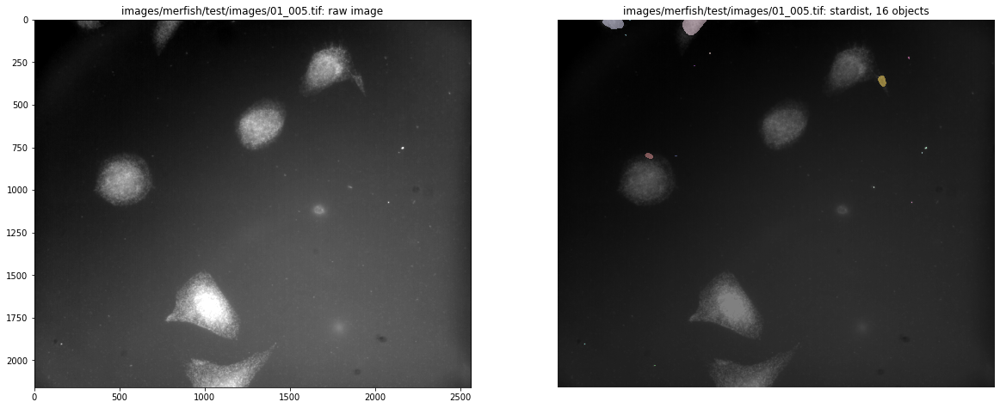

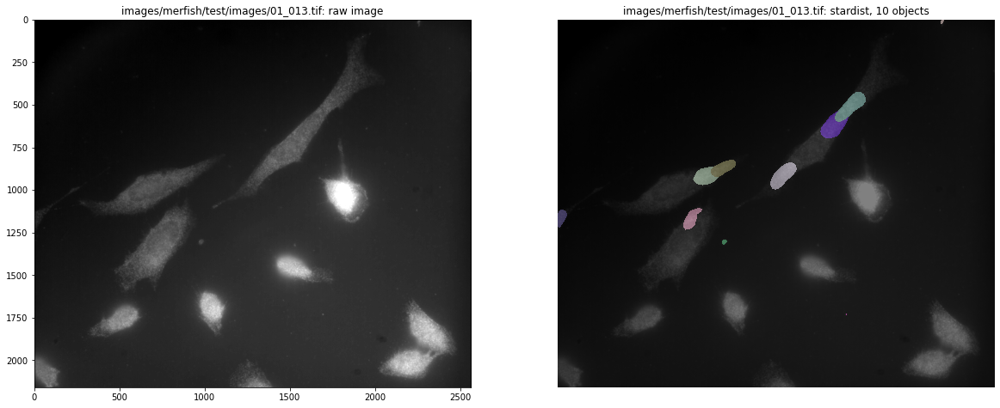

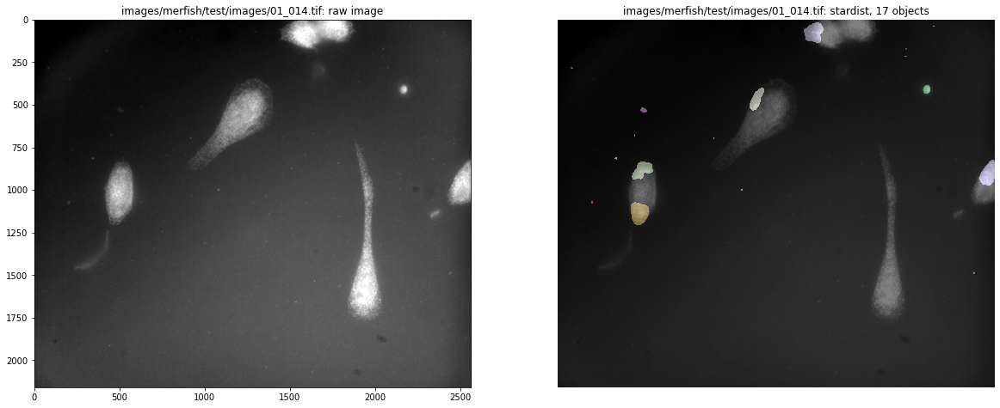

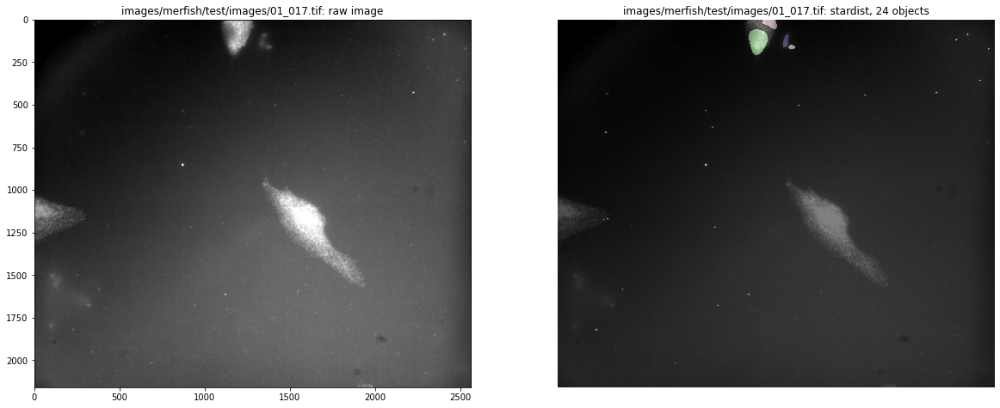

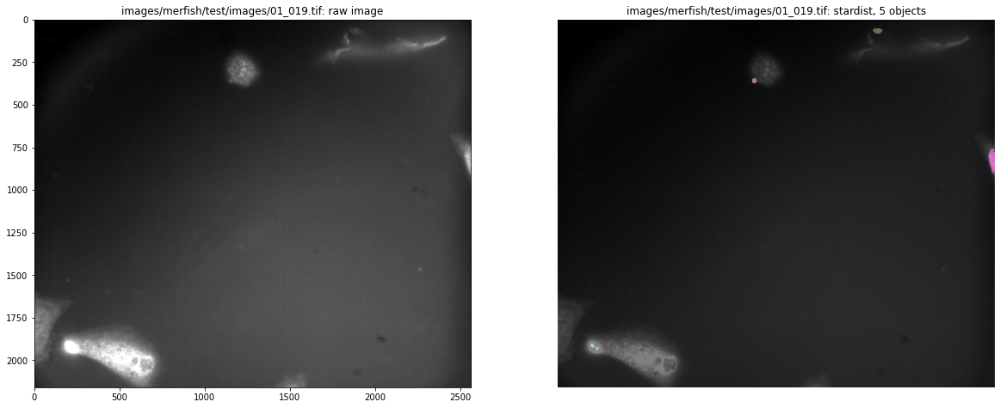

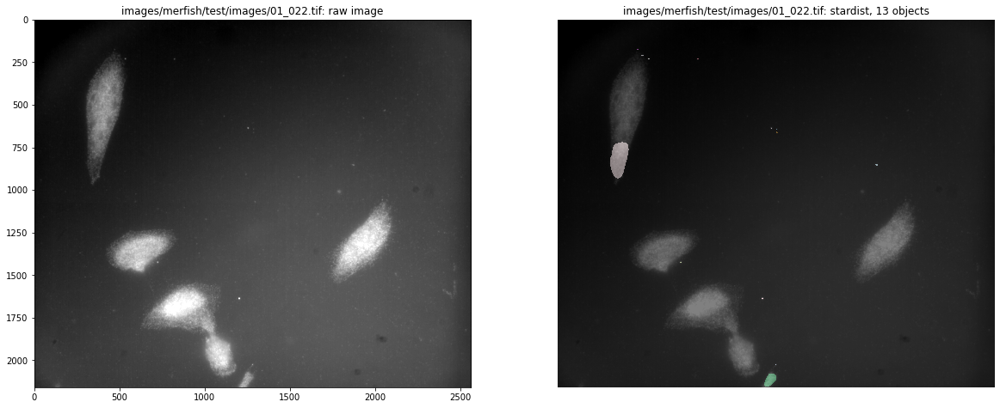

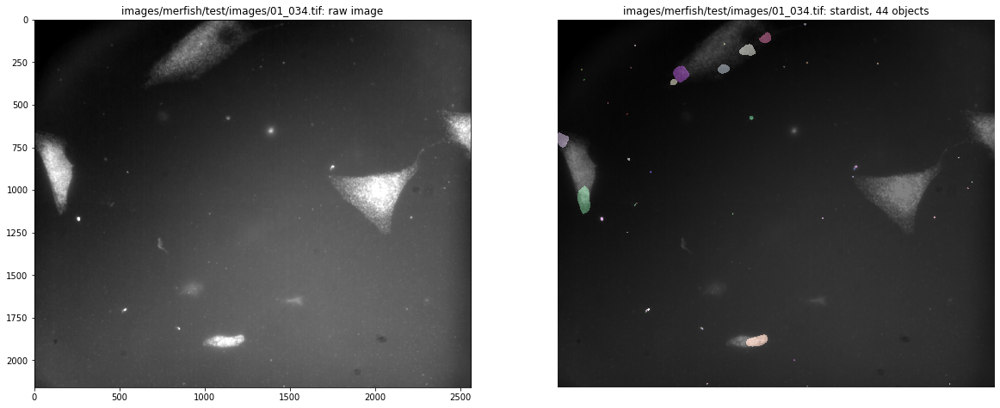

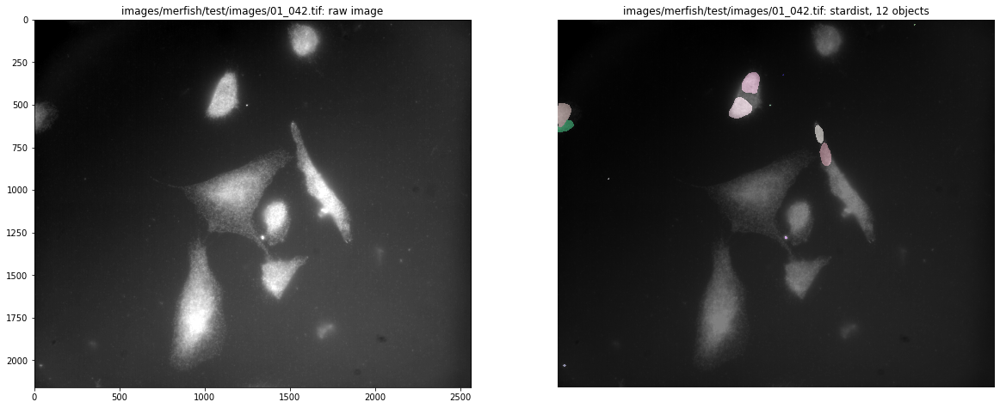

In [81]:
for i in range(len(merfish_X_test)):
  fig, axes = plt.subplots(1, 2, figsize=(20, 10))
  axes[0].imshow(merfish_X_test[i], clim=(0,1), cmap='gray')
  axes[0].set_title(f'{merfish_X_test_names[i]}: raw image')
  axes[1].imshow(merfish_X_test[i], clim=(0,1), cmap='gray')
  axes[1].imshow(pretrained_stardist_merfish_Y_pred[i][0], cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
  num_objects = len(pretrained_stardist_merfish_Y_pred[i][1]['coord'])
  axes[1].set_title(f'{merfish_X_test_names[i]}: stardist, {num_objects} objects')
  axes[1].axis('off')

# Train SplineDist Model on HeLa Cells data

In [87]:
import sys
sys.path.append('splinedistm')

from splinedist import fill_label_holes, random_label_cmap, calculate_extents, gputools_available
from splinedist.models import Config2D, SplineDist2D, SplineDistData2D
from splinedist.utils import phi_generator, grid_generator, get_contoursize_max

In [88]:
# Read train images and masks, normalize train images
hela_X_train_names = sorted(glob(f'{hela_dir}/train/images/*.tif'))
hela_X_train = [normalize(img, 1, 99.8, axis=(0, 1)) for img in tqdm(list(map(io.imread, hela_X_train_names)))]
hela_Y_train_names = sorted(glob(f'{hela_dir}/train/masks/*.tif'))
hela_Y_train = list(map(io.imread, hela_Y_train_names))

100%|██████████| 92/92 [00:01<00:00, 62.79it/s]


In [89]:
def train_validation_split(X, Y):
  rng = np.random.default_rng(591)
  indices = rng.permutation(len(X))
  split_val = max(1, int(round(0.25 * len(indices))))
  train_indices, valid_indices = indices[split_val:], indices[:split_val]
  X_train, X_valid = [X[i] for i in train_indices], [X[i] for i in valid_indices]
  Y_train, Y_valid = [Y[i] for i in train_indices], [Y[i] for i in valid_indices]

  print(f'Number of images: {len(X)}')
  print(f'- training: {len(train_indices)}')
  print(f'- validation: {len(valid_indices)}')
  return X_train, Y_train, X_valid, Y_valid

In [90]:
hela_X_train, hela_Y_train, hela_X_valid, hela_Y_valid = train_validation_split(hela_X_train, hela_Y_train)

Number of images: 92
- training: 69
- validation: 23


In [91]:
# Using configuration from SplineDist example
# choose the number of control points (M)
M = 6
n_params = 2 * M

# Predict on subsampled grid for increased efficiency and larger field of view
grid = (2,2)

# compute the size of the largest contour present in the image-set
contoursize_max = get_contoursize_max(hela_Y_train)

conf = Config2D (
    n_params        = n_params,
    grid            = grid,
    n_channel_in    = 1,
    contoursize_max = contoursize_max,
)
print(conf)
vars(conf)

Config2D(axes='YXC', backbone='unet', contoursize_max=132, grid=(2, 2), n_channel_in=1, n_channel_out=13, n_dim=2, n_params=12, net_conv_after_unet=128, net_input_shape=(None, None, 1), net_mask_shape=(None, None, 1), train_background_reg=0.0001, train_batch_size=4, train_checkpoint='weights_best.h5', train_checkpoint_epoch='weights_now.h5', train_checkpoint_last='weights_last.h5', train_completion_crop=32, train_dist_loss='mae', train_epochs=400, train_foreground_only=0.9, train_learning_rate=0.0003, train_loss_weights=(1, 0.2), train_n_val_patches=None, train_patch_size=(256, 256), train_reduce_lr={'factor': 0.5, 'patience': 40, 'min_delta': 0}, train_shape_completion=False, train_steps_per_epoch=100, train_tensorboard=True, unet_activation='relu', unet_batch_norm=False, unet_dropout=0.0, unet_kernel_size=(3, 3), unet_last_activation='relu', unet_n_conv_per_depth=2, unet_n_depth=3, unet_n_filter_base=32, unet_pool=(2, 2), unet_prefix='', use_gpu=False)


{'n_dim': 2,
 'axes': 'YXC',
 'n_channel_in': 1,
 'n_channel_out': 13,
 'train_checkpoint': 'weights_best.h5',
 'train_checkpoint_last': 'weights_last.h5',
 'train_checkpoint_epoch': 'weights_now.h5',
 'n_params': 12,
 'grid': (2, 2),
 'backbone': 'unet',
 'contoursize_max': 132,
 'unet_n_depth': 3,
 'unet_kernel_size': (3, 3),
 'unet_n_filter_base': 32,
 'unet_n_conv_per_depth': 2,
 'unet_pool': (2, 2),
 'unet_activation': 'relu',
 'unet_last_activation': 'relu',
 'unet_batch_norm': False,
 'unet_dropout': 0.0,
 'unet_prefix': '',
 'net_conv_after_unet': 128,
 'net_input_shape': (None, None, 1),
 'net_mask_shape': (None, None, 1),
 'train_shape_completion': False,
 'train_completion_crop': 32,
 'train_patch_size': (256, 256),
 'train_background_reg': 0.0001,
 'train_foreground_only': 0.9,
 'train_dist_loss': 'mae',
 'train_loss_weights': (1, 0.2),
 'train_epochs': 400,
 'train_steps_per_epoch': 100,
 'train_learning_rate': 0.0003,
 'train_batch_size': 4,
 'train_n_val_patches': None,


In [92]:
phi_generator(M, conf.contoursize_max)
grid_generator(M, conf.train_patch_size, conf.grid)

In [93]:
splinedist_hela_model = SplineDist2D(conf, name='splinedist_hela', basedir=model_dir) 

Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [94]:
splinedist_hela_model.train(hela_X_train, hela_Y_train, validation_data=(hela_X_valid, hela_Y_valid), augmenter=None, epochs=300) 

ob_loss: 0.0403 - val_dist_loss: 0.9326 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9241 - val_dist_relevant_mse: 1.8608
Epoch 245/300
100/100 [==============================] - 226s 2s/step - loss: 0.1708 - prob_loss: 0.0396 - dist_loss: 0.6560 - prob_kld: 0.0019 - dist_relevant_mae: 0.6474 - dist_relevant_mse: 0.8015 - val_loss: 0.2279 - val_prob_loss: 0.0403 - val_dist_loss: 0.9383 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9300 - val_dist_relevant_mse: 1.8867
Epoch 246/300
100/100 [==============================] - 229s 2s/step - loss: 0.1693 - prob_loss: 0.0374 - dist_loss: 0.6597 - prob_kld: 0.0018 - dist_relevant_mae: 0.6512 - dist_relevant_mse: 0.7963 - val_loss: 0.2288 - val_prob_loss: 0.0402 - val_dist_loss: 0.9426 - val_prob_kld: 0.0020 - val_dist_relevant_mae: 0.9343 - val_dist_relevant_mse: 1.8977
Epoch 247/300
100/100 [==============================] - 228s 2s/step - loss: 0.1695 - prob_loss: 0.0385 - dist_loss: 0.6550 - prob_kld: 0.0018 - dist_relevant_mae: 

Start: 9:15pm
End: 12:16am

Total time ~ 3 hours

In [95]:
# Load from disk
splinedist_hela_model = SplineDist2D(None, name='splinedist_hela', basedir=model_dir) 

Loading network weights from 'weights_best.h5'.
Couldn't load thresholds from 'thresholds.json', using default values. (Call 'optimize_thresholds' to change that.)
Using default values: prob_thresh=0.5, nms_thresh=0.4.


In [96]:
hela_Y_pred = [splinedist_hela_model.predict_instances(x, n_tiles=splinedist_hela_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(hela_X_test)]

100%|██████████| 92/92 [04:50<00:00,  3.16s/it]


In [97]:
hela_Y_pred_labels = [pred[0] for pred in hela_Y_pred]
hela_stats = [matching_dataset(hela_Y_test, hela_Y_pred_labels, thresh=t, show_progress=False) for t in taus]

In [98]:
hela_stats

[DatasetMatching(criterion='iou', thresh=0.1, fp=3192, tp=24593, fn=228, precision=0.885117869353968, recall=0.9908142298859837, accuracy=0.8779138257237711, f1=0.9349884043645211, n_true=24821, n_pred=27785, mean_true_score=0.8988143869301084, mean_matched_score=0.9071472328708259, panoptic_quality=0.8481721437855843, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.2, fp=3198, tp=24587, fn=234, precision=0.8849019254993702, recall=0.9905724990935095, accuracy=0.8775116884970913, f1=0.9347602935026423, n_true=24821, n_pred=27785, mean_true_score=0.8987758754595874, mean_matched_score=0.9073297272860624, panoptic_quality=0.8481358021815921, by_image=False),
 DatasetMatching(criterion='iou', thresh=0.3, fp=3207, tp=24578, fn=243, precision=0.8845780097174735, recall=0.9902099029047984, accuracy=0.8769088054802341, f1=0.934418127209824, n_true=24821, n_pred=27785, mean_true_score=0.8986889891462507, mean_matched_score=0.9075742289689596, panoptic_quality=0.8480538113370751, by

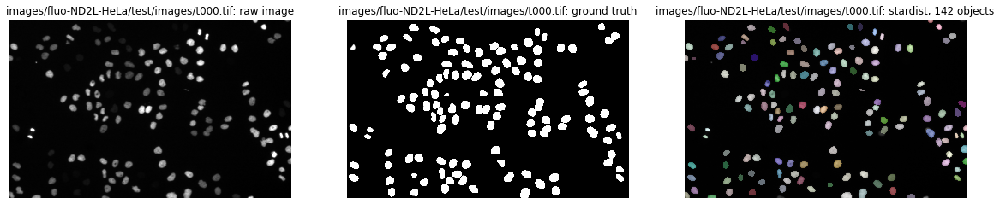

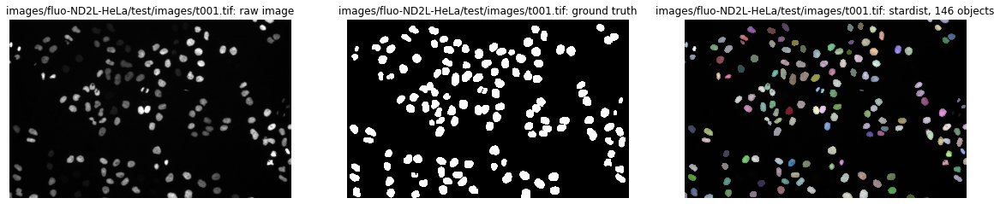

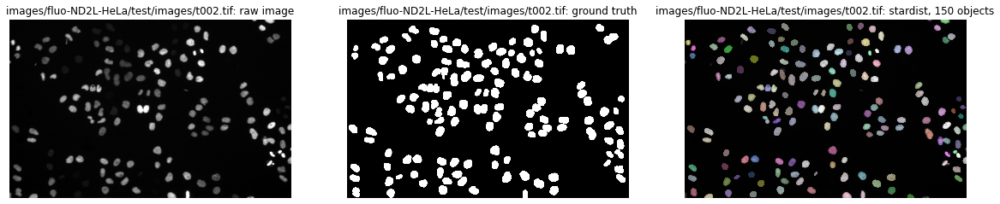

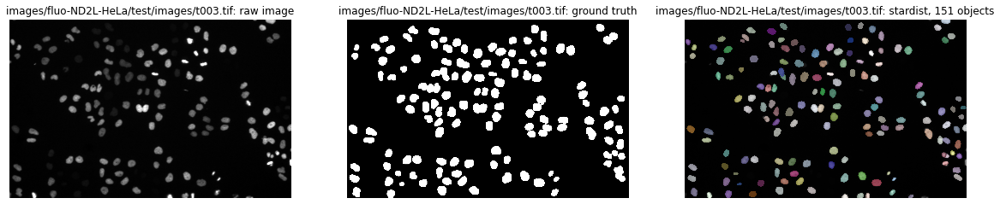

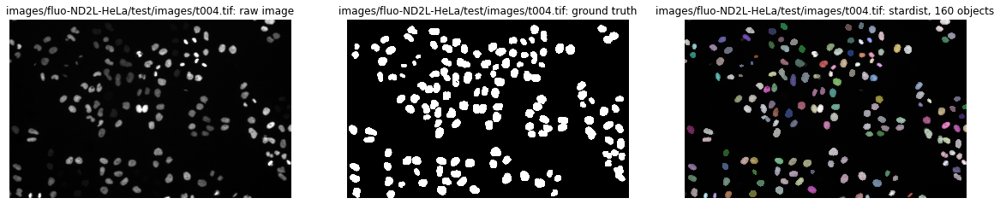

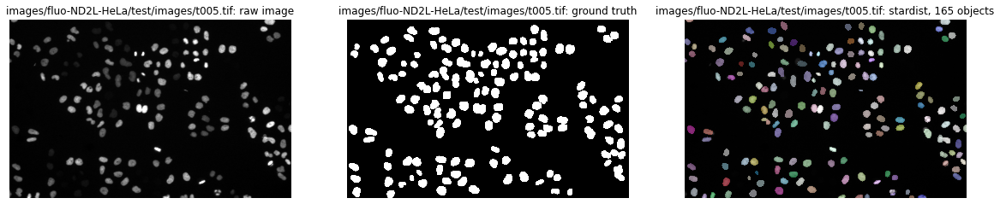

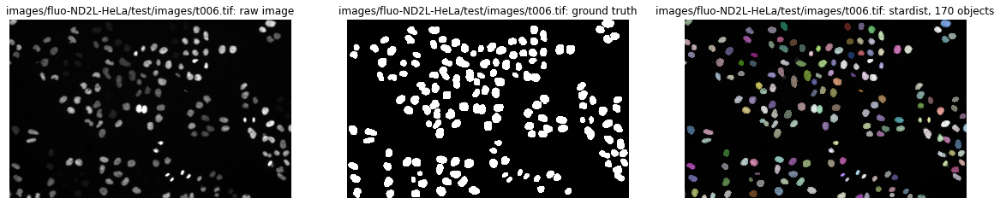

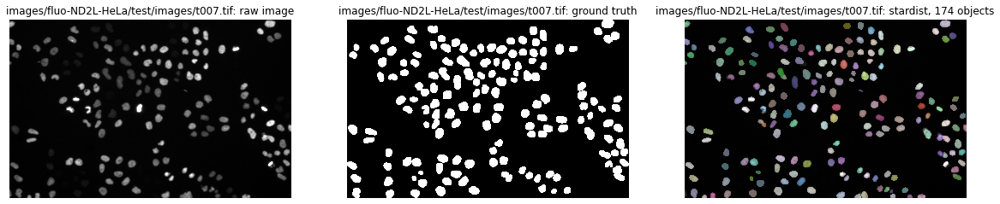

In [99]:
# Show first 8 predictions
for i in range(8):
  fig, axes = plt.subplots(1, 3, figsize=(20, 10))
  axes[0].imshow(hela_X_test[i], clim=(0,1), cmap='gray')
  axes[0].set_title(f'{hela_X_test_names[i]}: raw image')
  axes[0].axis('off')
  axes[1].imshow(hela_Y_test[i], clim=(0,1), cmap='gray')
  axes[1].set_title(f'{hela_X_test_names[i]}: ground truth')
  axes[1].axis('off')
  axes[2].imshow(hela_X_test[i], clim=(0,1), cmap='gray')
  axes[2].imshow(hela_Y_pred[i][0], cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
  num_objects = len(hela_Y_pred[i][1]['coord'])
  axes[2].set_title(f'{hela_X_test_names[i]}: stardist, {num_objects} objects')
  axes[2].axis('off');


In [101]:
merfish_Y_pred = [splinedist_hela_model.predict_instances(x, n_tiles=splinedist_hela_model._guess_n_tiles(x), show_tile_progress=False)
              for x in tqdm(merfish_X_test)]

100%|██████████| 8/8 [02:18<00:00, 17.32s/it]


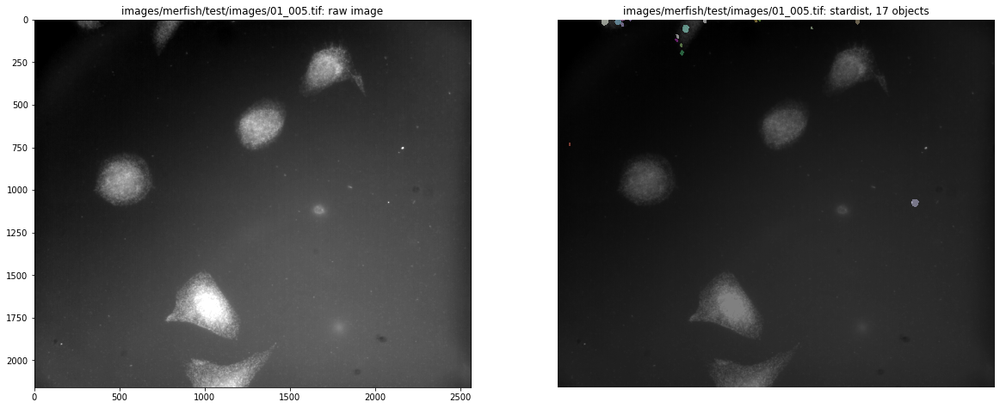

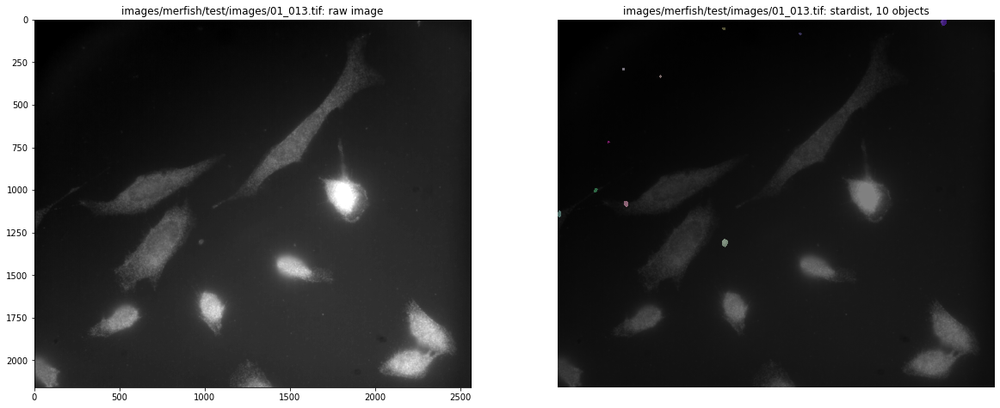

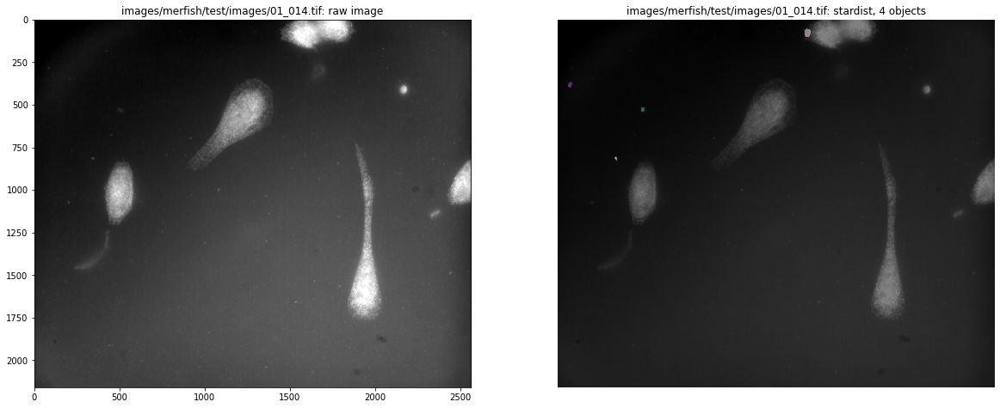

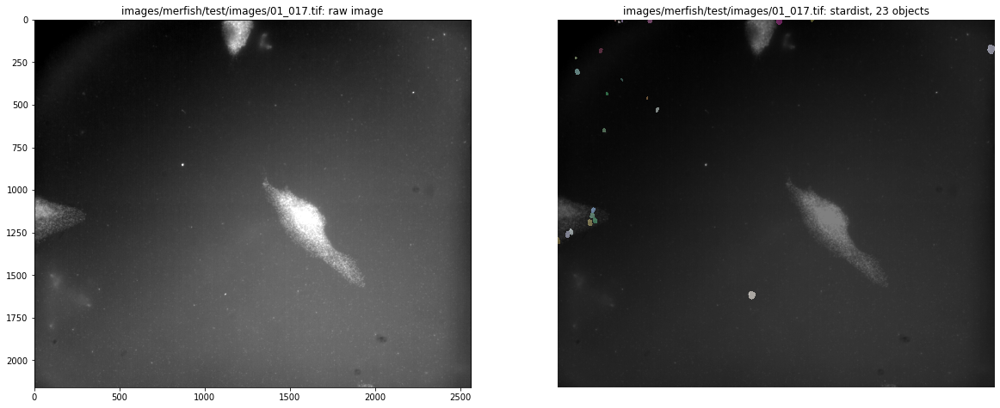

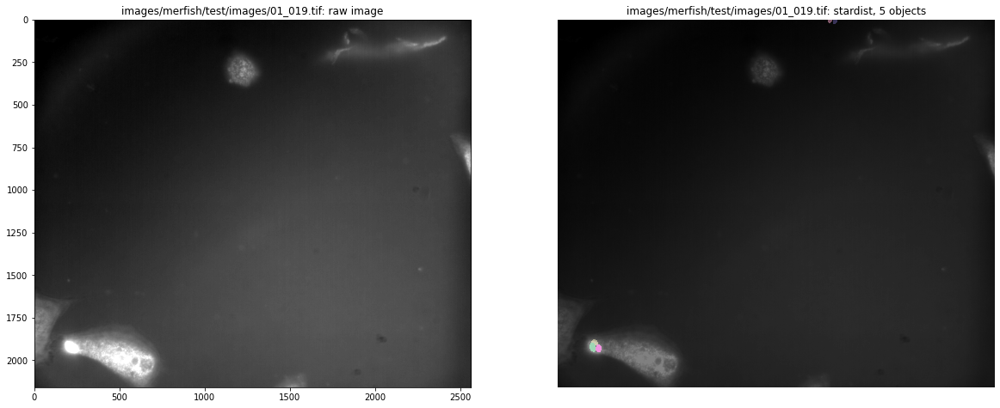

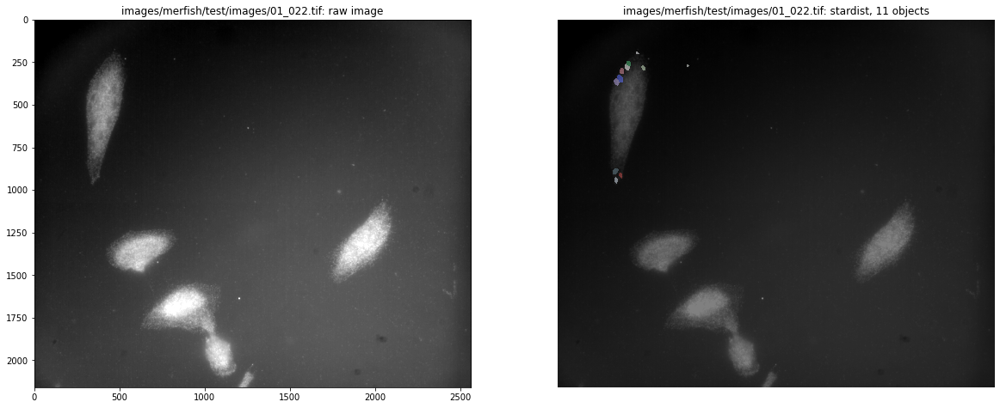

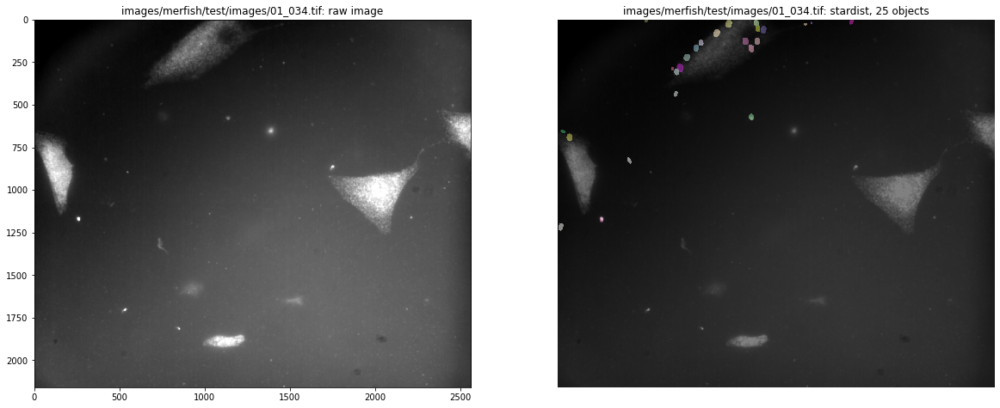

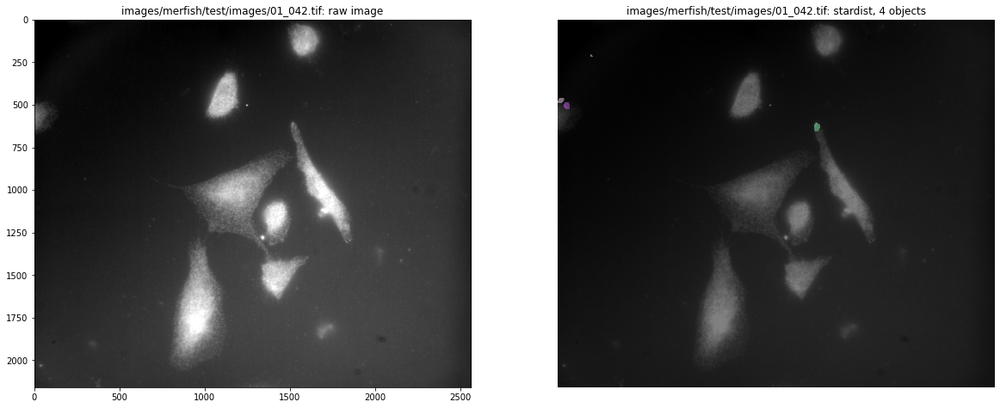

In [102]:
for i in range(len(merfish_X_test)):
  fig, axes = plt.subplots(1, 2, figsize=(20, 10))
  axes[0].imshow(merfish_X_test[i], clim=(0,1), cmap='gray')
  axes[0].set_title(f'{merfish_X_test_names[i]}: raw image')
  axes[1].imshow(merfish_X_test[i], clim=(0,1), cmap='gray')
  axes[1].imshow(merfish_Y_pred[i][0], cmap=lbl_cmap, interpolation="nearest", alpha=0.5)
  num_objects = len(merfish_Y_pred[i][1]['coord'])
  axes[1].set_title(f'{merfish_X_test_names[i]}: stardist, {num_objects} objects')
  axes[1].axis('off')


# Conda environment package versions
Name                |    Version
---|---
absl-py             |     0.11.0
appnope             |     0.1.2
astunparse          |     1.6.3
backcall            |     0.2.0
blas                |     1.0
ca-certificates     |    2020.12.8
cachetools          |     4.2.0
certifi             |     2020.12.5
chardet             |     4.0.0
csbdeep             |     0.6.1
cycler              |     0.10.0
decorator           |     4.4.2
flatbuffers         |     1.12
gast                |     0.3.3
google-auth         |     1.24.0
google-auth-oauthlib|     0.4.2
google-pasta        |     0.2.0
grpcio              |     1.32.0
h5py                |     2.10.0
idna                |     2.10
imagecodecs         |     2020.12.24
imagecodecs-lite    |     2020.1.31
imageio             |     2.9.0
intel-openmp        |     2019.4
ipykernel           |     5.4.2
ipython             |     7.19.0
ipython-genutils    |     0.2.0
jedi                |     0.18.0
jupyter-client      |     6.1.7
jupyter-core        |     4.7.0
keras               |     2.3.1
keras-applications  |     1.0.8
keras-preprocessing |     1.1.2
kiwisolver          |     1.3.1
libcxx              |     10.0.0
libedit             |     3.1.20191231
libffi              |     3.3
llvmlite            |     0.35.0
markdown            |     3.3.3
matplotlib          |     3.3.3
mkl                 |     2019.4
mkl-service         |     2.3.0
mkl_fft             |     1.2.0
mkl_random          |     1.1.1
ncurses             |     6.2
networkx            |     2.5
numba               |     0.52.0
numpy               |     1.19.2
numpy-base          |     1.19.2
oauthlib            |     3.1.0
opencv-python       |     4.4.0.46
openssl             |     1.1.1i
opt-einsum          |     3.3.0
parso               |     0.8.1
pexpect             |     4.8.0
pickleshare         |     0.7.5
pillow              |     8.0.1
pip                 |     20.3.3
prompt-toolkit      |     3.0.8
protobuf            |     3.14.0
ptyprocess          |     0.6.0
pyasn1              |     0.4.8
pyasn1-modules      |     0.2.8
pygments            |     2.7.3
pyparsing           |     2.4.7
python              |     3.8.5
python-dateutil     |     2.8.1
pywavelets          |     1.1.1
pyyaml              |     5.3.1
pyzmq               |     20.0.0
readline            |     8.0
requests            |     2.25.1
requests-oauthlib   |     1.3.0
rsa                 |     4.6
scikit-image        |     0.18.1
scipy               |     1.5.4
setuptools          |     51.1.0
six                 |    1.15.0
sqlite              |     3.33.0
stardist            |     0.6.1
tensorboard         |     2.4.0
tensorboard-plugin-wit  |  1.7.0
tensorflow          |     2.4.0
tensorflow-estimator|     2.4.0
termcolor           |     1.1.0
tifffile            |     2020.12.8
tk                  |     8.6.10
tornado             |     6.1
tqdm                |     4.55.0
traitlets           |     5.0.5
typing-extensions   |     3.7.4.3
urllib3             |     1.26.2
wcwidth             |     0.2.5
werkzeug            |     1.0.1
wheel               |     0.36.2
wrapt               |     1.12.1
xz                  |     5.2.5
zlib                |     1.2.11               